___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN<br><br>KC House Data<br><h1>

# Keras Regression

In [130]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [131]:
#!pip install folium             
#!conda install folium -c conda-forge

In [132]:
#from google.colab import drive
#drive.mount('/content/drive')

In [133]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [134]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [135]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [136]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [137]:
df.isnull().sum().any()

False

In [138]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### İd_number

In [139]:
df = df.drop('id', axis = 1)

# id_number modelin eğitiminde bir fayda sağlamayacağından drop ediyoruz .

### price

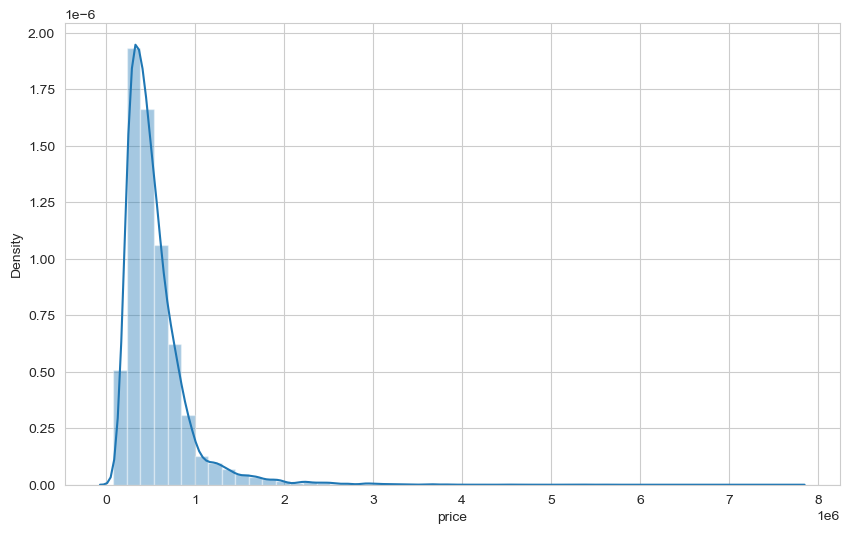

In [11]:
sns.distplot(df['price']);

In [12]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [ ]:
# 3000000'dan daha fazla price'ı olan datalarda bir anormallik olmadığından hiç birisini drop etmiyoruz.

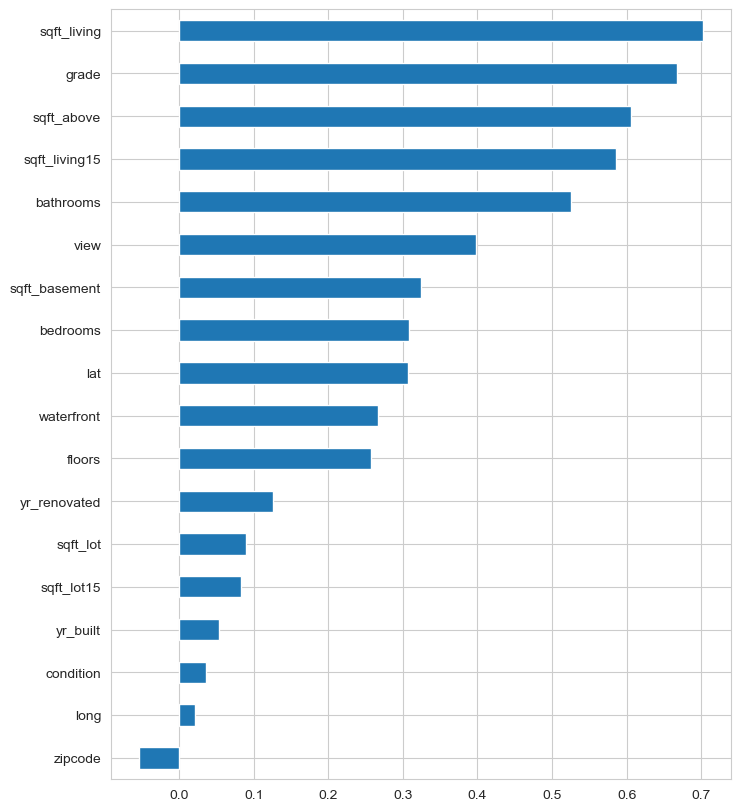

In [13]:
plt.figure(figsize = (8,10))
df.corr(numeric_only=True)["price"].sort_values().drop("price").plot(kind = "barh");

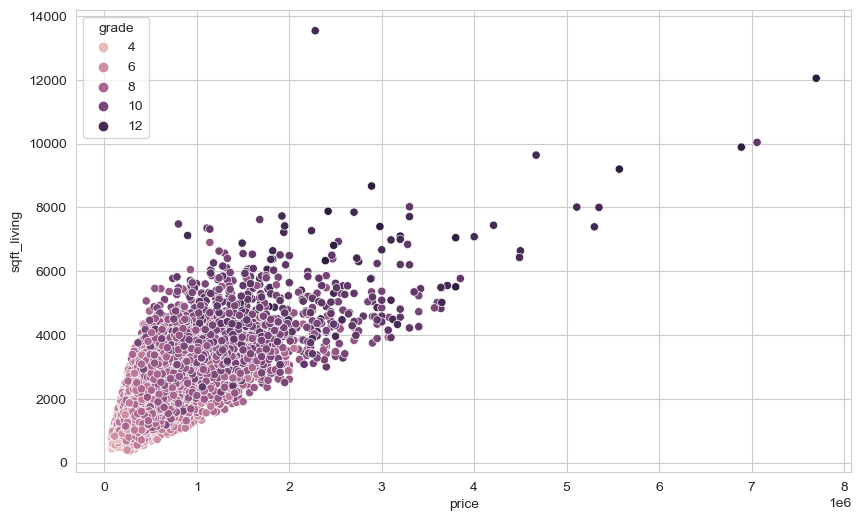

In [14]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

### bedrooms

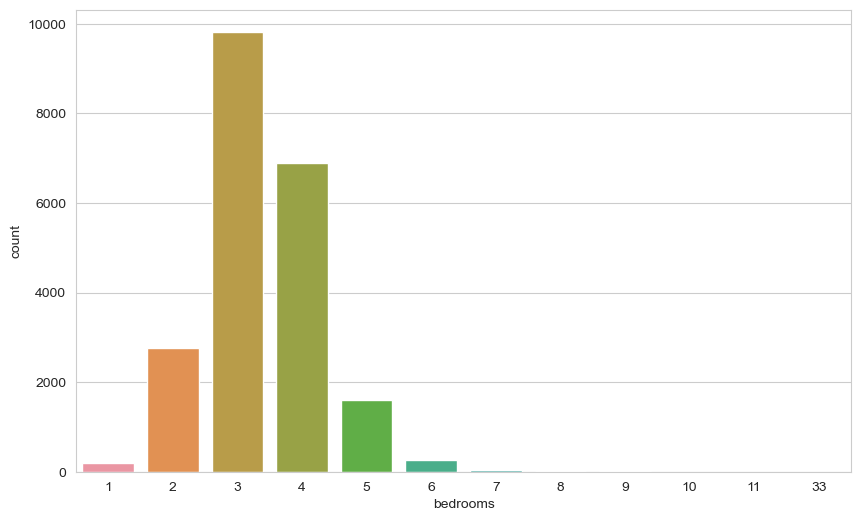

In [15]:
sns.countplot(x = df['bedrooms'])
plt.show()

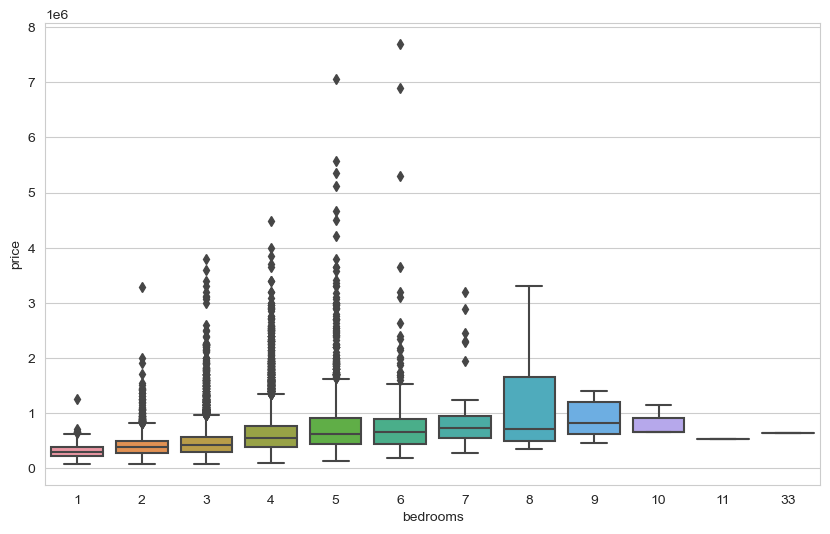

In [16]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [17]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [18]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [19]:
df.shape

(21596, 20)

### date

In [140]:
df['date'].dtype

dtype('O')

In [141]:
df['date']

0        10/13/2014
1         12/9/2014
2         2/25/2015
3         12/9/2014
4         2/18/2015
            ...    
21592     5/21/2014
21593     2/23/2015
21594     6/23/2014
21595     1/16/2015
21596    10/15/2014
Name: date, Length: 21597, dtype: object

In [142]:
df['date'] = pd.to_datetime(df['date'])

In [143]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21597, dtype: datetime64[ns]

In [144]:
df['year'] = df['date'].dt.year
#df['year'] = df['date'].apply(lambda date : date.year)

# yıl feature ekliyoruz datamıza yıllara göre model bir şeyler öğrenebilir mi diye 

In [145]:
df['month'] = df['date'].dt.month

# ay feature ekliyoruz datamıza aylara göre model bir şeyler öğrenebilir mi diye 

In [146]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


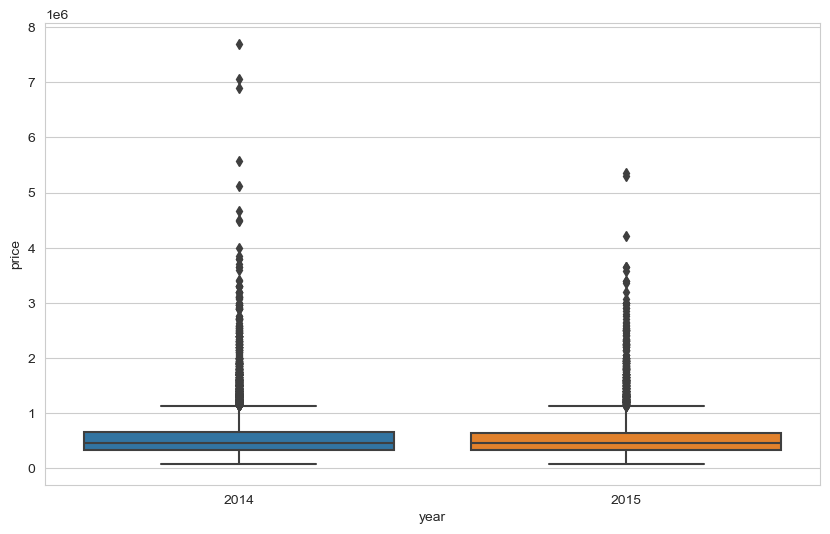

In [147]:
sns.boxplot(x = 'year', y = 'price', data = df);

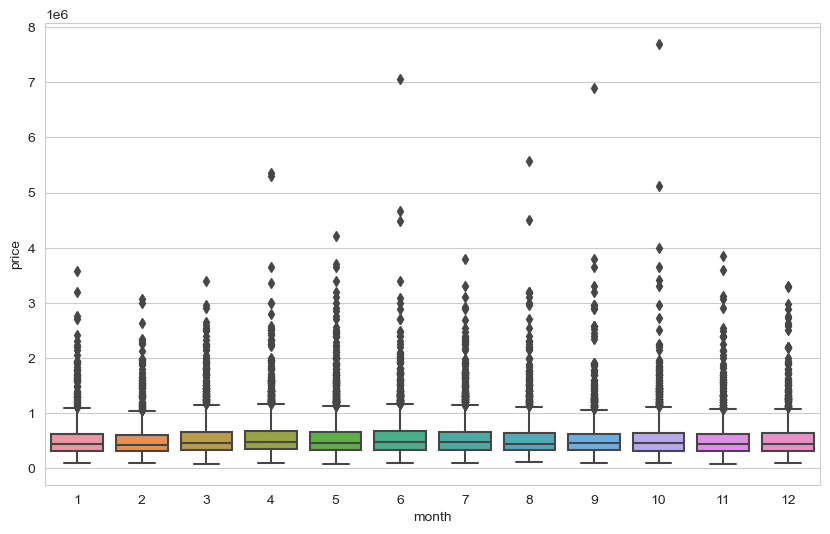

In [148]:
sns.boxplot(x = 'month', y = 'price', data = df);

In [29]:
df = df.drop(['date', "year", "month"], axis = 1)


# min. features max score mantığından hareketle date , year ve month featurelarını drop ediyoruz ;
# çünkü hem yıllara göre hem de aylara göre baktığımızda bariz ön plana çıkan bir durum yok .

### zipcode

In [30]:
df['zipcode'].value_counts(dropna = False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.


If you want to keep zipcodes, look into [hash encoding](https://medium.com/flutter-community/dealing-with-categorical-features-with-high-cardinality-feature-hashing-7c406ff867cb).

In [31]:
df = df.drop('zipcode', axis = 1)


# lat ve lon featureları olduğu için elimizde zipcode featurenu da drop ediyoruz .

### yr_renovated & yr_built

In [32]:
df['yr_renovated'].value_counts(dropna = False)

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

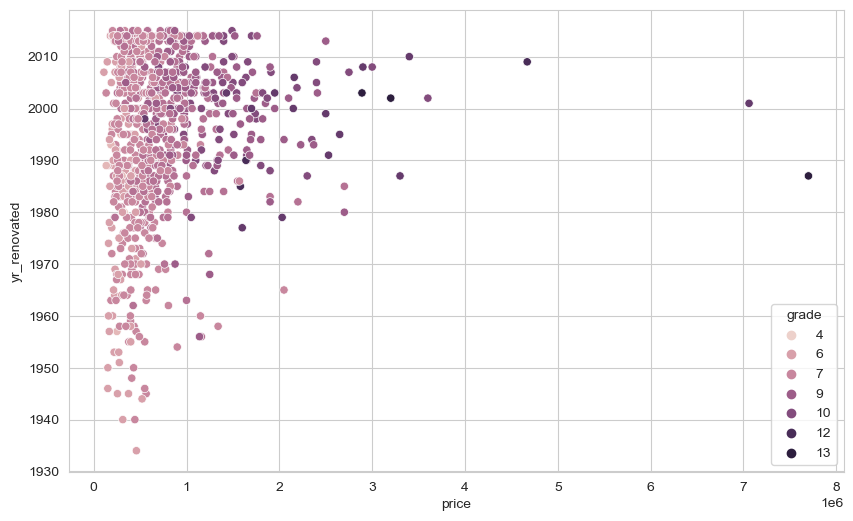

In [33]:
sns.scatterplot(x = 'price',y = 'yr_renovated', data = df[df.yr_renovated!=0], hue = "grade");

In [34]:
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

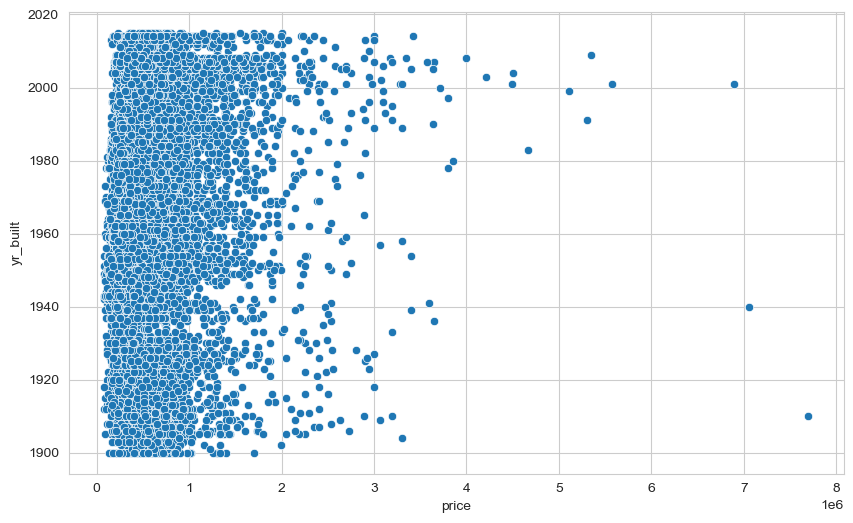

In [35]:
sns.scatterplot(x = 'price',y = 'yr_built', data = df);

In [36]:
df.yr_renovated.apply(lambda x : x if x == 0 else 1).value_counts()


0    20682
1      914
Name: yr_renovated, dtype: int64

In [37]:
df["renovated"] = df.yr_renovated.apply(lambda x : x if x == 0 else 1)


## renovasyona uğrayan evler 1 uğramayanlar 0 olacak şekilde df'imize yeni bir feature ekliyoruz.

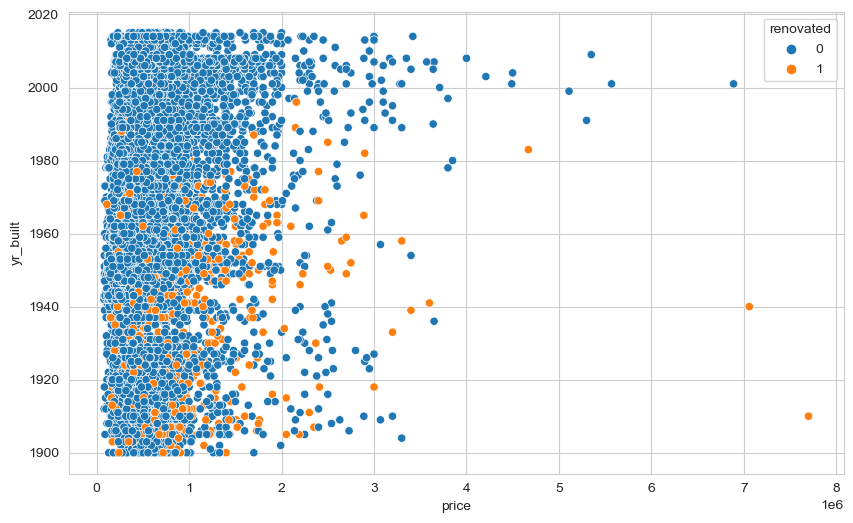

In [38]:
sns.scatterplot(x = 'price',y = 'yr_built', data = df, hue = "renovated")
plt.show()

In [39]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
df["built|renovated"]


# yeni bir feature daha ekliyoruz df'imize renovasyonun adam akıllı bir renovasyon olduğu kabulüyle ;
# renovasyona uğramış evler sanki o tarihte inşa edilmiş gibi davranıp bir feature engineering yapıyoruz. 

0       1955.000
1       1991.000
2       1933.000
3       1965.000
4       1987.000
          ...   
21592   2009.000
21593   2014.000
21594   2009.000
21595   2004.000
21596   2008.000
Name: built|renovated, Length: 21596, dtype: float64

In [40]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,renovated,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,1,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1987.000


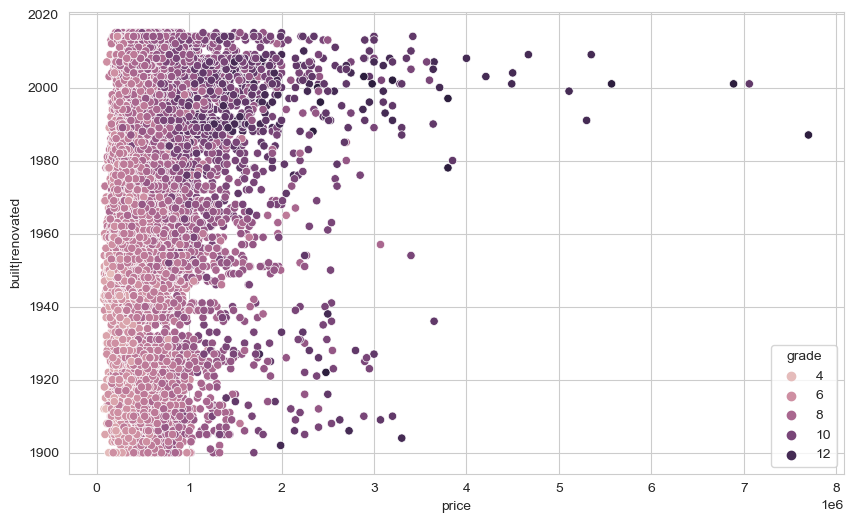

In [41]:
sns.scatterplot(x = 'price',y = 'built|renovated', data = df, hue = "grade");

In [42]:
df.drop(["yr_renovated", "yr_built", "renovated"], axis = 1, inplace = True)

# elimizde "built|renovated" artık bu feature olduğundan diğerlerini drop ediyoruz .

### sqft_basement

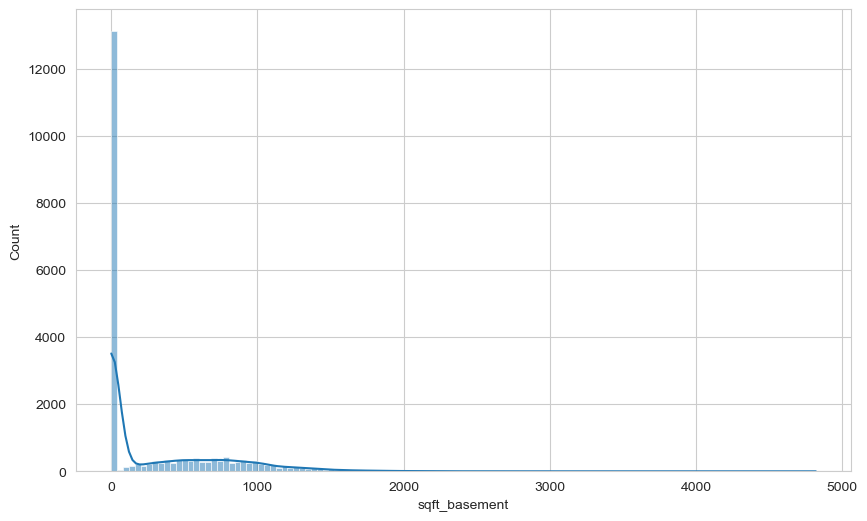

In [43]:
sns.histplot(df["sqft_basement"], kde=True)
plt.show()

In [44]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

# 3000'den daha büyük bodruma sahip olan evler outlier gibi durduğundan onlara bakıyoruz ama ; 
# sqft_living = sqft_above + sqft_basement şartını hepsi sağladığından bunları düşmüyoruz.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000


### sqft_above

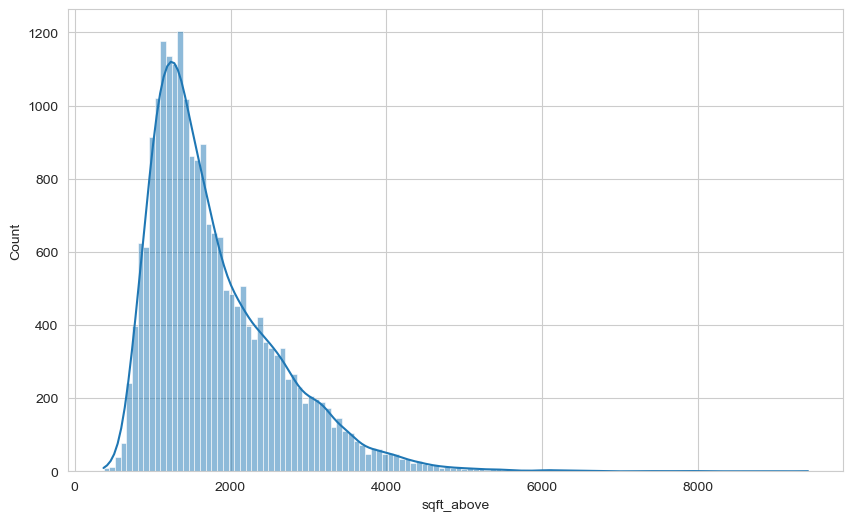

In [45]:
sns.histplot(df["sqft_above"], kde=True)
plt.show()

In [46]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

# 6000'den daha büyük sqft_above'ı olan evler outlier gibi durduğundan onlara bakıyoruz ama ; 
# sqft_living = sqft_above + sqft_basement şartını hepsi sağladığından bunları düşmüyoruz.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

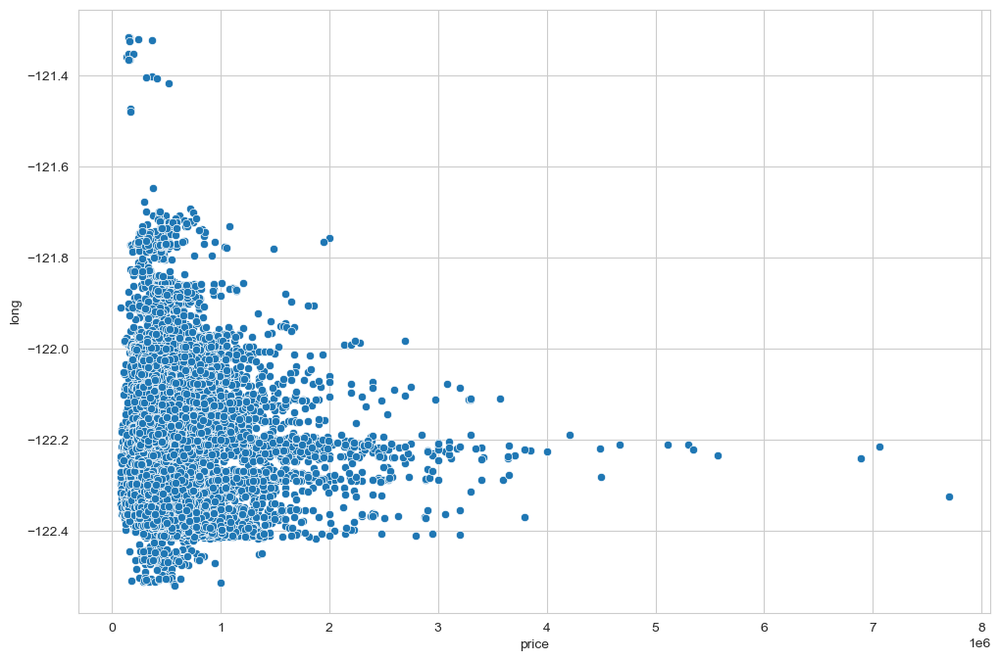

In [47]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

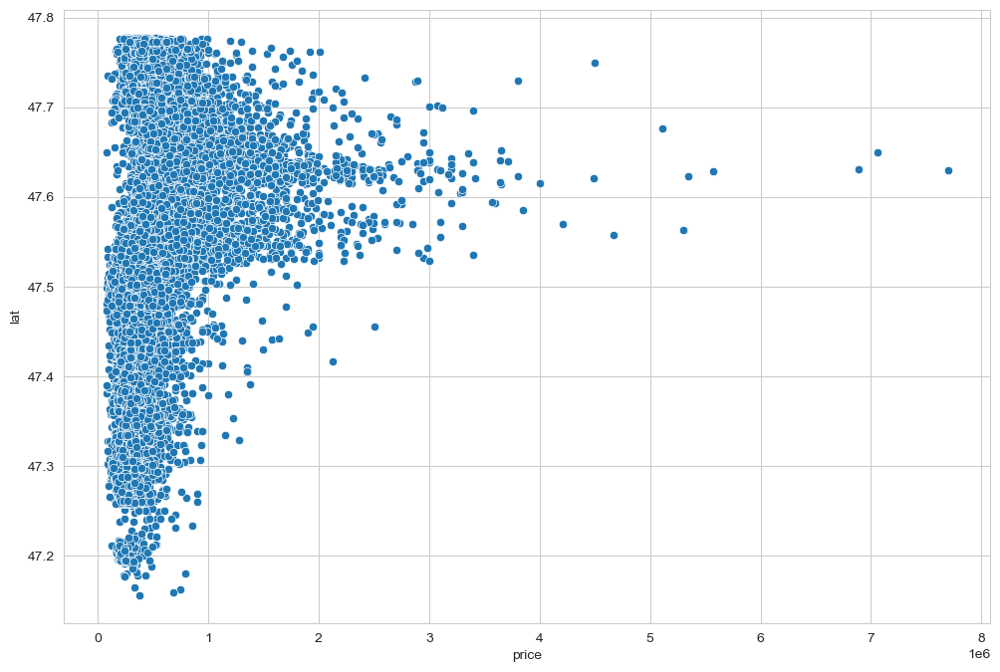

In [48]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

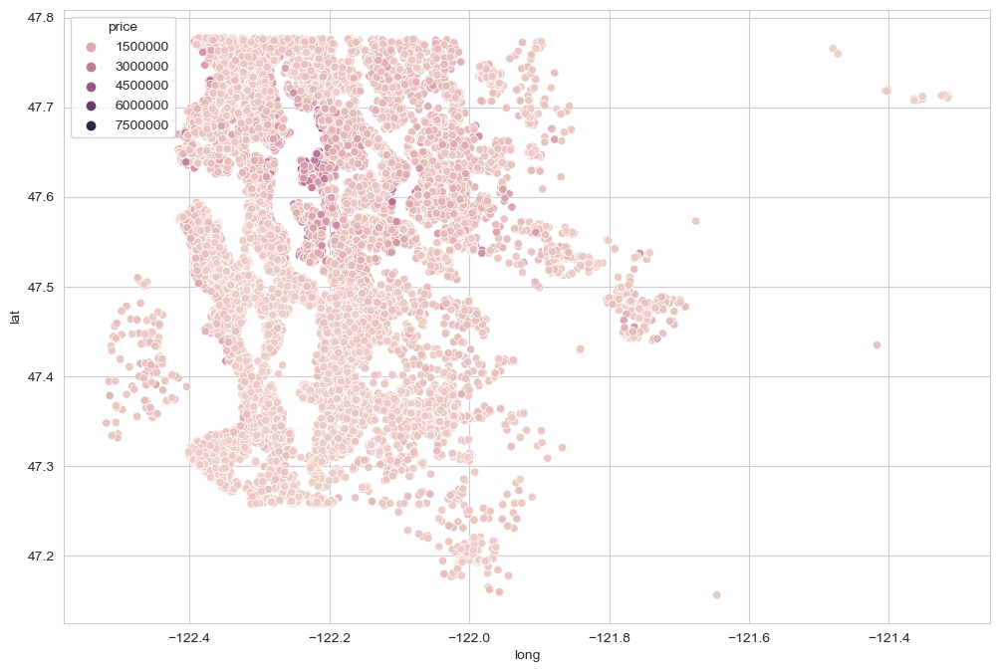

In [49]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price')
plt.show()

## long ve lat featurelarını scatter plotta gösterip renklendirmelerini de price'a göre yapmak için hue = 'price' yapıyoruz.
# long ve lat değerleri elimizde olduğundan haritayı andıran bir görüntüyle karşılaşıyoruz.

In [ ]:
# renklendirmeyi price'a göre yaptığımızdan yüksek fiyatlı evler koyu renkleri aldığından ve elimizde yüksek fiyata satılan ev
# sayısı az olduğundan bunlar olmadan bir görselleştirme yapsak nasıl olur diye düşünüyoruz :

In [50]:
len(df) * (0.01)

# datamızın %1'i 216 satıra tekabül ediyor .

215.96

In [51]:
df.sort_values('price', ascending = False).head(216)

## en pahalı 216'i getiriyorum :

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,47.620,-122.212,2370,13320,1951.000


In [52]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]

## burada da en pahalı 216 hariç diğer bütün evleri non_top_1_perc adında bir değişkene atıyorum.renklendirme yaptığımızda 
# daha anlaşılır insgiht'lar elde etmek için.

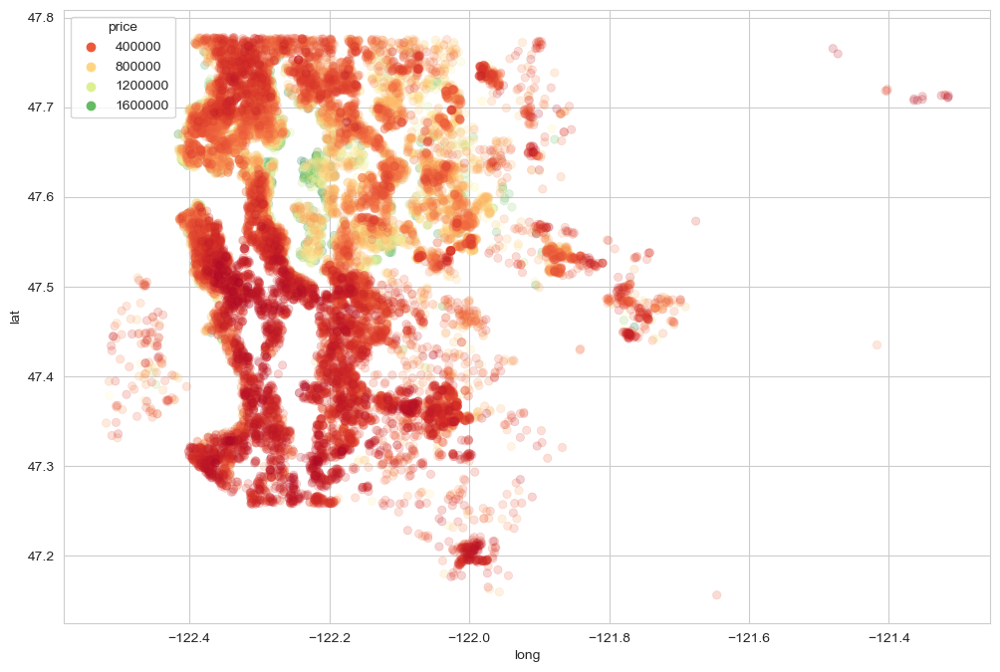

In [53]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

In [ ]:
# daha da düzgün insightlar çıkarabilmek için folium kütüphanesini kullancağız : 

# folium kütüphanesi ; veri görselleştirme için kullanılan bir harita oluşturma kütüphanesidir .
# folium, verilerin coğrafi konumunu görselleştirmek için kullanılır. 

In [54]:
import folium
import branca.colormap as cm

# branca.colormap modülü, Python'da renk haritaları (color map) oluşturmak için kullanılan bir kütüphanedir.
# Burada biz price'lara göre bir renklendirme yapacağımız için onu da import ediyoruz .

In [55]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

# folium.Map içerisine vereceğimiz location'a göre dünya üzerindeki her yerin haritasını getirebilir. 
# bizim elimizde lat ve long faetureları olduğundan bunların mean'lerini kullanarak haritanın defeault olarak nereden 
#başlayacağını belirtiyoruz ; zoom_start:default zoom oranıdır ama kodu çalıştırınca istediğimiz gibi harita üzerinde gezip,
# zoom vs de yapabiliriz .

In [56]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()


## çeşitli stepler belirliyorum ki price min'den max'a doğru olacak şekilde ; renklendirmeyi güzel bir şekilde yapabileyim .

In [57]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
# haritamızı m adlı bir değişkene atıyoruz .
colormap = cm.StepColormap(
                        colors=["red","orange","yellow","green"] ,
                        index=[step_1, step_2, step_3, step_4, step_5],
                        vmin=step_1,
                        vmax=step_5)

# en düşük price red en yüksek price green olacak şekilde steplerimi belirliyorum  ve colormap adlı değişkene atıyorum.

for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1,
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m


# for döngüsündeki içerideki zip'le location'ı zipliyorum (lat,long) dışarıdaki zip'le de location'lara karşılık gelen 
# price'ları zipliyoum ((lat,log),price) ardından for döngüsüyle tuple unpacking yapıyorum loc = (lat,long) p = price 
# olacak şekilde her location ve price göre yukarıda tanımladığım renklendirmeyi haritama .add_to(m) ile ekliyorum.

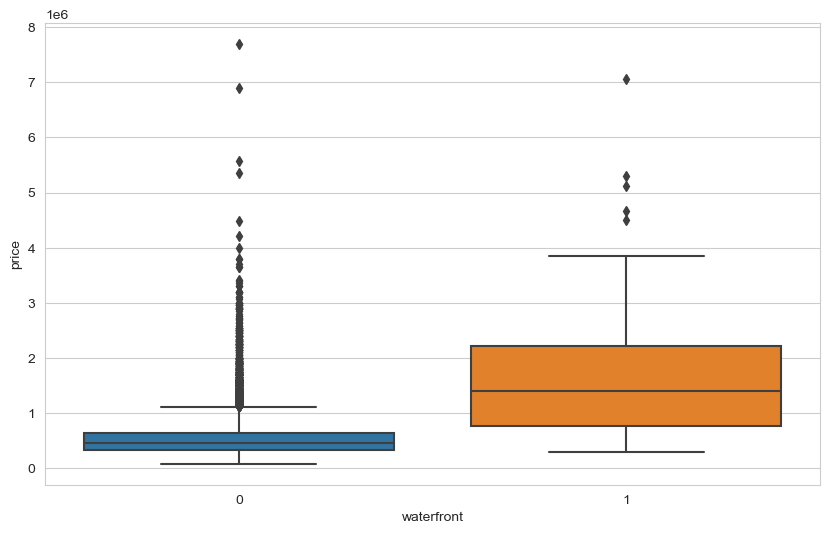

In [58]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [149]:
df.groupby("waterfront").price.mean()

# haritadan da waterfront'u olan evlerin daha pahalı olduğunu görmüştük burada da teyit etmiş olduk .

waterfront
0    531762.324
1   1662524.184
Name: price, dtype: float64

### latest data

In [60]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [61]:
df.shape

(21596, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [62]:
from sklearn.model_selection import train_test_split

In [63]:
X = df.drop('price', axis = 1)
y = df['price']

In [64]:
seed = 101

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed)

In [66]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

In [67]:
scaler = MinMaxScaler()


## ann arka planda gradient descent çalıştırdığı için scaler'a ihtiyaç duyar.

In [68]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [69]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Dense,Activation # Activation'ı bir layer olarak "da" kullanabiliriz 
                                                           # o yüzden burada onu da import ettim.

In [70]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [71]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = mean_squared_error(actual, pred,squared=False)
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [72]:
X_train.shape

(19436, 16)

In [125]:
tf.keras.utils.set_random_seed(seed) 

# biz normalde modelin mimarisini her kurduğumuzda random olarak ağırlıkları ve bias'leri atıyor ama biz şimdi 
# learning rate , dropout , earlystopping gibi kavramlar göreceğiz onların farklarını görebilmek için 
# tf.keras.utils.set_random_seed(seed)  ile model her çalıştığında aynı ağırlıkları atasın istiyorum.

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
#model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer.  
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

# targetımız price olduğundan continous değerlerden oluştuğundan output layerda 1  nöron olacak şekilde mimamirizi oluşturuyoruz


model.compile(optimizer="adam", loss="mse")


# problemimiz regresyon problemi olduğundan loss = "mse" yapıyoruz . optimizer hyperparametresi ağırlıkları güncellerken
# hangi gradient descent türünü kullanmak istediğimizle alakalıdır 'rmsprop' gibi "adam" gibi optimizer çeşitlerini deneyerek
# en iyi sonucu hangisi veriyorsa yola onunla devam etmemiz gerekir burada optimizer türü datadan dataya göre farklılık gösterir

In [127]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_25 (Dense)            (None, 24)                408       
                                                                 
 dense_26 (Dense)            (None, 24)                600       
                                                                 
 dense_27 (Dense)            (None, 12)                300       
                                                                 
 dense_28 (Dense)            (None, 6)                 78        
                                                                 
 dense_29 (Dense)            (None, 1)                 7         
                                                                 
Total params: 1,393
Trainable params: 1,393
Non-trainable params: 0
_________________________________________________________________


In [128]:
model.weights

[<tf.Variable 'dense_25/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-0.35647073,  0.38490498, -0.08744469,  0.15377373,  0.22215843,
         -0.02771163,  0.11982757, -0.35179138, -0.22738509, -0.01394773,
          0.37500745,  0.17092556, -0.33209184,  0.32572126,  0.04000178,
          0.28462964, -0.04399332,  0.19303006,  0.24007684, -0.07156605,
         -0.07338411, -0.26527756, -0.10138947, -0.12765884],
        [ 0.20285243,  0.1625874 ,  0.09493753,  0.210621  , -0.3477749 ,
          0.04268652,  0.24083078, -0.3537471 , -0.37514928,  0.31485617,
         -0.10756519,  0.02557248,  0.0060361 ,  0.10938206, -0.04046023,
          0.38605756,  0.05352944,  0.2004916 ,  0.16421968, -0.09854421,
          0.27363658,  0.14958262, -0.26525187, -0.17038073],
        [-0.14781646,  0.22237402, -0.25978014, -0.08758965, -0.01525185,
         -0.27800336,  0.36590946, -0.04418713,  0.21475899, -0.20625347,
         -0.21336366, -0.06695104, -0.19746223, -0.03350914,  0.2

In [76]:
X_train.shape

(19436, 16)

In [77]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)


# validation_split, eğitim verilerinin bir kısmını validation setine ayırmak için kullanılır.burada 0.15 belirttiğimizden ;
# train setinin SONDAN %15 validation olarak ayrılır.
# Validation seti, modelin eğitim sırasında performansını değerlendirmek için kullanılır.
# Validation seti  üzerinde modelin performansı izlenir eğitimde ve eğitim verileri üzerindeki performansla karşılaştırılır.
# Bu sayede, model ---> overfitting mi olmuş underfitting mi olmuş bu sayede gözlemlenir.

Epoch 1/1000
130/130 [==============================] - 2s 5ms/step - loss: 428607209472.0000 - val_loss: 423966932992.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 427920916480.0000 - val_loss: 421725765632.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 419527491584.0000 - val_loss: 403136937984.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 379121827840.0000 - val_loss: 335299215360.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 275288621056.0000 - val_loss: 204268584960.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 147546357760.0000 - val_loss: 111842099200.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 97283440640.0000 - val_loss: 100163698688.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 92646727680.0000 - val_loss: 99083288576.0000
Epoch 9/100

130/130 [==============================] - 0s 2ms/step - loss: 34453544960.0000 - val_loss: 38527455232.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 34475438080.0000 - val_loss: 38375899136.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 34383474688.0000 - val_loss: 38344417280.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 34332456960.0000 - val_loss: 38216884224.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 34320756736.0000 - val_loss: 38236573696.0000
Epoch 138/1000
130/130 [==============================] - 1s 4ms/step - loss: 34281113600.0000 - val_loss: 38300753920.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 34272489472.0000 - val_loss: 38132850688.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 34227073024.0000 - val_loss: 38102487040.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 32056217600.0000 - val_loss: 34876174336.0000
Epoch 266/1000
130/130 [==============================] - 0s 3ms/step - loss: 32052510720.0000 - val_loss: 34874699776.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 32069324800.0000 - val_loss: 34943188992.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 32040693760.0000 - val_loss: 34712694784.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 32024279040.0000 - val_loss: 35089829888.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 32044572672.0000 - val_loss: 34961629184.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 31995611136.0000 - val_loss: 34738704384.0000
Epoch 272/1000
130/130 [==============================] - 0s 3ms/step - loss: 32010055680.0000 - val_loss: 34908733440.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 31044833280.0000 - val_loss: 33558185984.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 31056900096.0000 - val_loss: 33556058112.0000
Epoch 399/1000
130/130 [==============================] - 0s 3ms/step - loss: 31079993344.0000 - val_loss: 33692538880.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 31087648768.0000 - val_loss: 33477036032.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 31039940608.0000 - val_loss: 33469593600.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 31032293376.0000 - val_loss: 33414449152.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 31002892288.0000 - val_loss: 33962502144.0000
Epoch 404/1000
130/130 [==============================] - 0s 3ms/step - loss: 31029905408.0000 - val_loss: 33428682752.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 29149835264.0000 - val_loss: 31377395712.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 29115467776.0000 - val_loss: 31397486592.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 29087217664.0000 - val_loss: 31210788864.0000
Epoch 532/1000
130/130 [==============================] - 0s 3ms/step - loss: 29050372096.0000 - val_loss: 31379195904.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 29034153984.0000 - val_loss: 31181836288.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 28981991424.0000 - val_loss: 31095799808.0000
Epoch 535/1000
130/130 [==============================] - 0s 3ms/step - loss: 28958674944.0000 - val_loss: 31228653568.0000
Epoch 536/1000
130/130 [==============================] - 0s 3ms/step - loss: 28935131136.0000 - val_loss: 31034783744.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 22668812288.0000 - val_loss: 25078654976.0000
Epoch 662/1000
130/130 [==============================] - 0s 3ms/step - loss: 22642706432.0000 - val_loss: 24931844096.0000
Epoch 663/1000
130/130 [==============================] - 0s 3ms/step - loss: 22573594624.0000 - val_loss: 24944611328.0000
Epoch 664/1000
130/130 [==============================] - 0s 3ms/step - loss: 22562754560.0000 - val_loss: 24878393344.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 22514888704.0000 - val_loss: 25031299072.0000
Epoch 666/1000
130/130 [==============================] - 0s 3ms/step - loss: 22555160576.0000 - val_loss: 24881692672.0000
Epoch 667/1000
130/130 [==============================] - 0s 3ms/step - loss: 22521069568.0000 - val_loss: 24887736320.0000
Epoch 668/1000
130/130 [==============================] - 0s 3ms/step - loss: 22465200128.0000 - val_loss: 25010196480.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 20497987584.0000 - val_loss: 23960225792.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 20440594432.0000 - val_loss: 23720228864.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 20490944512.0000 - val_loss: 23692605440.0000
Epoch 796/1000
130/130 [==============================] - 0s 3ms/step - loss: 20454060032.0000 - val_loss: 23711862784.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 20418727936.0000 - val_loss: 23770966016.0000
Epoch 798/1000
130/130 [==============================] - 0s 3ms/step - loss: 20463953920.0000 - val_loss: 23635920896.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 20443672576.0000 - val_loss: 23835826176.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 20383555584.0000 - val_loss: 23894702080.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 19311286272.0000 - val_loss: 23230513152.0000
Epoch 926/1000
130/130 [==============================] - 0s 3ms/step - loss: 19305068544.0000 - val_loss: 23137101824.0000
Epoch 927/1000
130/130 [==============================] - 0s 3ms/step - loss: 19288805376.0000 - val_loss: 23501946880.0000
Epoch 928/1000
130/130 [==============================] - 0s 3ms/step - loss: 19275685888.0000 - val_loss: 23204155392.0000
Epoch 929/1000
130/130 [==============================] - 0s 3ms/step - loss: 19299328000.0000 - val_loss: 23358259200.0000
Epoch 930/1000
130/130 [==============================] - 0s 3ms/step - loss: 19264112640.0000 - val_loss: 23377264640.0000
Epoch 931/1000
130/130 [==============================] - 0s 3ms/step - loss: 19245924352.0000 - val_loss: 23071062016.0000
Epoch 932/1000
130/130 [==============================] - 0s 4ms/step - loss: 19290593280.0000 - val_loss: 23047315456.0000
Epoch 933/1000
130/130 

In [78]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-6.10680759e-01,  1.46539807e-01,  1.66626021e-01,
         -8.26307058e-01,  1.39048219e-01, -2.77116299e-02,
         -1.72282696e-01, -6.79056108e-01, -5.16690433e-01,
         -3.20174158e-01, -2.02715278e-01, -3.26754957e-01,
         -2.32496905e+00, -9.04721439e-01, -6.41792119e-01,
         -1.16364563e+00, -4.39933240e-02, -1.72643781e+00,
         -9.78197083e-02, -1.48626530e+00, -1.69945192e+00,
          1.89888561e+00, -4.43255723e-01, -1.74832895e-01],
        [ 9.62551594e-01,  7.09682584e-01, -2.46204570e-01,
          8.67970109e-01,  1.25311530e+00,  4.26865220e-02,
          1.00115252e+00,  4.20322597e-01,  4.52722043e-01,
          1.08570182e+00,  2.29927564e+00,  1.71051753e+00,
          1.45089948e+00,  7.07674861e-01,  7.42562175e-01,
          1.24615347e+00,  5.35294414e-02,  1.48936069e+00,
          2.16118060e-02,  2.21548462e+00,  2.03263712e+00,
          1.38293064e+00,  4.69

In [79]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,428607209472.000,423966932992.000
1,427920916480.000,421725765632.000
2,419527491584.000,403136937984.000
3,379121827840.000,335299215360.000
4,275288621056.000,204268584960.000
...,...,...
995,18797144064.000,22711322624.000
996,18725287936.000,23254546432.000
997,18776049664.000,22886225920.000
998,18698440704.000,22853412864.000


<Axes: >

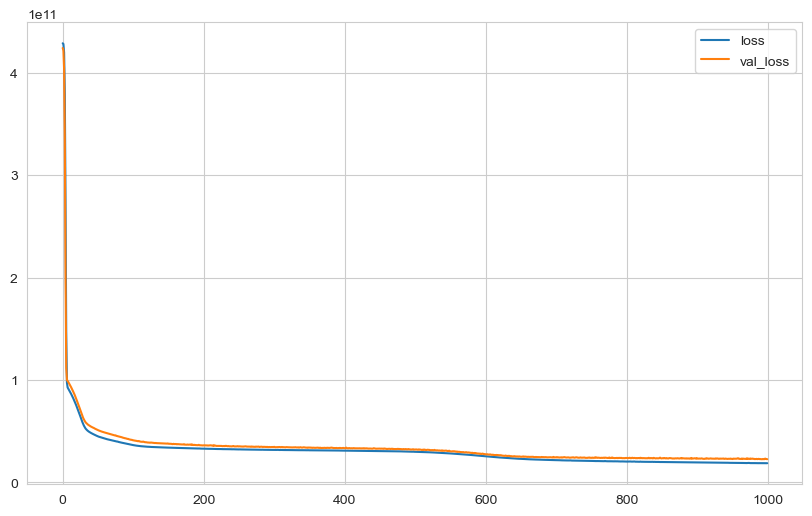

In [80]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
# val_loss ve loss değerleri beraber aynı şekilde düşmüşler biz daha fazla modeli eğitebiliriz yani epoch sayısını artırabiliriz
# çünkü overfittig bir durum gözükmüyor.

In [81]:
model.evaluate(X_test, y_test, verbose=0)

18512230400.0

In [82]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [83]:
eval_metric(y_test, y_pred)

r2_score: 0.8559132370450099 
mae: 81000.44641927084 
mse: 18512233002.751 
rmse: 136059.66706835278


In [ ]:
#epoch sayısını artırabiliriz  ama şimdi bir de learning rate 'in nasıl bir etkisi olacak onu görmek için 
# diğer her şeyi sabit tutup learning rate ile oynayacağız :

### learning_rate

In [84]:
from tensorflow.keras.optimizers import Adam


## -----> biz eğer bir optimizer'ın default learnig rate'ini değiştirmek istiyorsak tensorflow.keras.optimizers'dan
## ----------> hangi optimizerın learning rate'ini değiştireceksek önce onu import ediyoruz.

In [85]:
tf.keras.utils.set_random_seed(seed) 

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.002) # default learning rate value is 0.001

# optimizer'ı compile'a string olarak verdiğimizde "adam" gibi ; bu default learning rate kullanacağım demektir bunu değiştirmek
# istiyorsak opt = Adam(lr = 0.002) bu şekilde tanımlayıp içerisine istediğimiz lr oranını yazıp ardından compile satırına
# bunu tanımlıyoruz :


model.compile(optimizer = opt, loss = 'mse')

In [86]:
model.weights

[<tf.Variable 'dense_5/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-0.35647073,  0.38490498, -0.08744469,  0.15377373,  0.22215843,
         -0.02771163,  0.11982757, -0.35179138, -0.22738509, -0.01394773,
          0.37500745,  0.17092556, -0.33209184,  0.32572126,  0.04000178,
          0.28462964, -0.04399332,  0.19303006,  0.24007684, -0.07156605,
         -0.07338411, -0.26527756, -0.10138947, -0.12765884],
        [ 0.20285243,  0.1625874 ,  0.09493753,  0.210621  , -0.3477749 ,
          0.04268652,  0.24083078, -0.3537471 , -0.37514928,  0.31485617,
         -0.10756519,  0.02557248,  0.0060361 ,  0.10938206, -0.04046023,
          0.38605756,  0.05352944,  0.2004916 ,  0.16421968, -0.09854421,
          0.27363658,  0.14958262, -0.26525187, -0.17038073],
        [-0.14781646,  0.22237402, -0.25978014, -0.08758965, -0.01525185,
         -0.27800336,  0.36590946, -0.04418713,  0.21475899, -0.20625347,
         -0.21336366, -0.06695104, -0.19746223, -0.03350914,  0.27

In [87]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 428471451648.0000 - val_loss: 423029014528.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 413666770944.0000 - val_loss: 373082587136.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 264734916608.0000 - val_loss: 136316239872.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 99720314880.0000 - val_loss: 99427860480.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 91144675328.0000 - val_loss: 97032839168.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 88582012928.0000 - val_loss: 94361411584.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 85987344384.0000 - val_loss: 91926773760.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 83271450624.0000 - val_loss: 89026625536.0000
Epoch 9/1000
130/1

130/130 [==============================] - 0s 3ms/step - loss: 32186445824.0000 - val_loss: 34951585792.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 32199874560.0000 - val_loss: 34852896768.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 32115777536.0000 - val_loss: 34822021120.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 32037126144.0000 - val_loss: 34660806656.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 32038119424.0000 - val_loss: 34715799552.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 31978768384.0000 - val_loss: 35095687168.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 32017602560.0000 - val_loss: 34656186368.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 31933005824.0000 - val_loss: 34658185216.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 29172299776.0000 - val_loss: 31302381568.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 29152661504.0000 - val_loss: 31256743936.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 29190289408.0000 - val_loss: 31265918976.0000
Epoch 268/1000
130/130 [==============================] - 0s 3ms/step - loss: 29110923264.0000 - val_loss: 31022264320.0000
Epoch 269/1000
130/130 [==============================] - 0s 3ms/step - loss: 29060425728.0000 - val_loss: 31540725760.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 29146339328.0000 - val_loss: 31372306432.0000
Epoch 271/1000
130/130 [==============================] - 0s 3ms/step - loss: 29035702272.0000 - val_loss: 31001683968.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 29104070656.0000 - val_loss: 31127097344.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26949050368.0000 - val_loss: 30140209152.0000
Epoch 398/1000
130/130 [==============================] - 0s 3ms/step - loss: 26971568128.0000 - val_loss: 29687746560.0000
Epoch 399/1000
130/130 [==============================] - 0s 3ms/step - loss: 26980497408.0000 - val_loss: 30186328064.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 27019345920.0000 - val_loss: 29611153408.0000
Epoch 401/1000
130/130 [==============================] - 0s 3ms/step - loss: 26937729024.0000 - val_loss: 29663590400.0000
Epoch 402/1000
130/130 [==============================] - 0s 3ms/step - loss: 26890960896.0000 - val_loss: 29506297856.0000
Epoch 403/1000
130/130 [==============================] - 0s 3ms/step - loss: 26856224768.0000 - val_loss: 30370834432.0000
Epoch 404/1000
130/130 [==============================] - 0s 3ms/step - loss: 26920206336.0000 - val_loss: 29602883584.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 21783650304.0000 - val_loss: 26051741696.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 21680357376.0000 - val_loss: 25940201472.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 21607682048.0000 - val_loss: 25611165696.0000
Epoch 532/1000
130/130 [==============================] - 0s 3ms/step - loss: 21511315456.0000 - val_loss: 25887576064.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 21466683392.0000 - val_loss: 25527138304.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 21409460224.0000 - val_loss: 25492441088.0000
Epoch 535/1000
130/130 [==============================] - 0s 3ms/step - loss: 21341026304.0000 - val_loss: 25632268288.0000
Epoch 536/1000
130/130 [==============================] - 0s 3ms/step - loss: 21302786048.0000 - val_loss: 25264470016.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 17657792512.0000 - val_loss: 22457288704.0000
Epoch 662/1000
130/130 [==============================] - 0s 3ms/step - loss: 17661253632.0000 - val_loss: 22366402560.0000
Epoch 663/1000
130/130 [==============================] - 0s 3ms/step - loss: 17554827264.0000 - val_loss: 22549067776.0000
Epoch 664/1000
130/130 [==============================] - 0s 3ms/step - loss: 17568995328.0000 - val_loss: 22542495744.0000
Epoch 665/1000
130/130 [==============================] - 0s 3ms/step - loss: 17589110784.0000 - val_loss: 23175983104.0000
Epoch 666/1000
130/130 [==============================] - 0s 3ms/step - loss: 17576210432.0000 - val_loss: 22702673920.0000
Epoch 667/1000
130/130 [==============================] - 0s 3ms/step - loss: 17585725440.0000 - val_loss: 22510682112.0000
Epoch 668/1000
130/130 [==============================] - 0s 3ms/step - loss: 17518372864.0000 - val_loss: 22756517888.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 15875600384.0000 - val_loss: 22139082752.0000
Epoch 794/1000
130/130 [==============================] - 0s 3ms/step - loss: 15826238464.0000 - val_loss: 21638330368.0000
Epoch 795/1000
130/130 [==============================] - 0s 3ms/step - loss: 15841122304.0000 - val_loss: 21628674048.0000
Epoch 796/1000
130/130 [==============================] - 0s 3ms/step - loss: 15812990976.0000 - val_loss: 21833930752.0000
Epoch 797/1000
130/130 [==============================] - 0s 3ms/step - loss: 15825775616.0000 - val_loss: 21694087168.0000
Epoch 798/1000
130/130 [==============================] - 0s 3ms/step - loss: 15852221440.0000 - val_loss: 21368113152.0000
Epoch 799/1000
130/130 [==============================] - 0s 3ms/step - loss: 15771841536.0000 - val_loss: 21933529088.0000
Epoch 800/1000
130/130 [==============================] - 0s 3ms/step - loss: 15824514048.0000 - val_loss: 21718368256.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 14732664832.0000 - val_loss: 20781611008.0000
Epoch 926/1000
130/130 [==============================] - 1s 4ms/step - loss: 14718739456.0000 - val_loss: 20765024256.0000
Epoch 927/1000
130/130 [==============================] - 0s 3ms/step - loss: 14642605056.0000 - val_loss: 21443272704.0000
Epoch 928/1000
130/130 [==============================] - 0s 3ms/step - loss: 14696204288.0000 - val_loss: 21015316480.0000
Epoch 929/1000
130/130 [==============================] - 0s 4ms/step - loss: 14652893184.0000 - val_loss: 21213593600.0000
Epoch 930/1000
130/130 [==============================] - 0s 3ms/step - loss: 14660768768.0000 - val_loss: 21273309184.0000
Epoch 931/1000
130/130 [==============================] - 0s 4ms/step - loss: 14643361792.0000 - val_loss: 20786114560.0000
Epoch 932/1000
130/130 [==============================] - 0s 3ms/step - loss: 14621258752.0000 - val_loss: 20852254720.0000
Epoch 933/1000
130/130 

<Axes: >

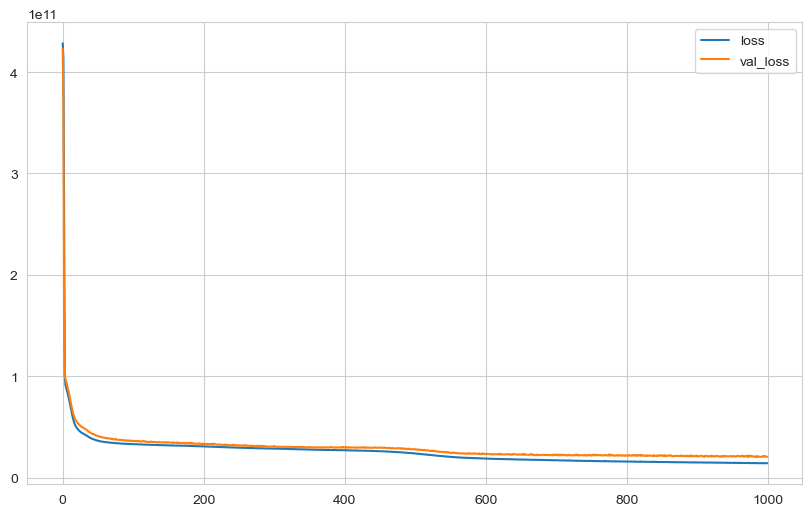

In [88]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [89]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [90]:
eval_metric(y_test, y_pred)

r2_score: 0.8876501701784907 
mae: 73669.11162208274 
mse: 14434679389.146286 
rmse: 120144.41056140017


In [ ]:
# learning rate'i 2 katına çıkardığımızda Step_size (adım büyüklüğümüz arttından) ; başka bir lokal minuma girmiş 
# ve daha düşük loss değerlerine ulaştığını görebiliyorum . learning rate best_pratice şu olur diye bir şey diyemeyiz ; 
# datadan dataya değişir bir kaç değer deneyip optimum lr değerini kendimiz belirleyebiliriz datamız için.

### EarlyStopping

In [91]:
from tensorflow.keras.callbacks import EarlyStopping

# EarlyStopping bir regularization tekniğidir.

In [92]:
tf.keras.utils.set_random_seed(seed) 


model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.002)


model.compile(optimizer = opt, loss = 'mse')

In [93]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 25, restore_best_weights = True)


# bir model eğitilirken EarlyStopping kullanmak istiyorsak onu bu şekilde tanımlayacağız : 

# "monitor" : Takip edilecek ölçütün adıdır.burada mesela val_loss kullandık ,
# biz val_loss'un minimum olmasını istediğimiz için mode = "min" yaptık .
# patience ise 25 epoch boyunca eğer val_loss düşmezse eğitimi durdurmasını söylüyoruz patience olarak da best pratice şu 
# olur diyebiliceğimiz bir durum yoktur . model eğer 25 epoch boyunca val_loss değerinde bir iyileşme görmezse eğitimi keser.
# restore_best_weights = True ise modelin eğitimi kestiği yerdeki değil de 25 epoch önceki ağırlıklar ile modeli kurmasını
# istediğimizi söylüyoruz default'u False'tur ve öyle bırakırsak eğitimi kestiği yerdeki ağırlıklar ile model eğitilmiş olur .

In [94]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])


## yukarıda tanımladığımız early stop değişkenini model.fit içerisinde callbacks hyperparametresine LİSTE içerisinde veriyoruz
# ki model early_stop kullanacağını anlasın.

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 428471451648.0000 - val_loss: 423029014528.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 413666770944.0000 - val_loss: 373082587136.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 264734916608.0000 - val_loss: 136316239872.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 99720314880.0000 - val_loss: 99427860480.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 91144675328.0000 - val_loss: 97032839168.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 88582012928.0000 - val_loss: 94361411584.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 85987344384.0000 - val_loss: 91926773760.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 83271450624.0000 - val_loss: 89026625536.0000
Epoch 9/1000
130/1

130/130 [==============================] - 0s 3ms/step - loss: 32186445824.0000 - val_loss: 34951585792.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 32199874560.0000 - val_loss: 34852896768.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 32115777536.0000 - val_loss: 34822021120.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 32037126144.0000 - val_loss: 34660806656.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 32038119424.0000 - val_loss: 34715799552.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 31978768384.0000 - val_loss: 35095687168.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 32017602560.0000 - val_loss: 34656186368.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 31933005824.0000 - val_loss: 34658185216.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 29172299776.0000 - val_loss: 31302381568.0000
Epoch 266/1000
130/130 [==============================] - 0s 4ms/step - loss: 29152661504.0000 - val_loss: 31256743936.0000
Epoch 267/1000
130/130 [==============================] - 0s 4ms/step - loss: 29190289408.0000 - val_loss: 31265918976.0000
Epoch 268/1000
130/130 [==============================] - 0s 3ms/step - loss: 29110923264.0000 - val_loss: 31022264320.0000
Epoch 269/1000
130/130 [==============================] - 0s 3ms/step - loss: 29060425728.0000 - val_loss: 31540725760.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 29146339328.0000 - val_loss: 31372306432.0000
Epoch 271/1000
130/130 [==============================] - 0s 3ms/step - loss: 29035702272.0000 - val_loss: 31001683968.0000
Epoch 272/1000
130/130 [==============================] - 0s 3ms/step - loss: 29104070656.0000 - val_loss: 31127097344.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26949050368.0000 - val_loss: 30140209152.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 26971568128.0000 - val_loss: 29687746560.0000
Epoch 399/1000
130/130 [==============================] - 0s 3ms/step - loss: 26980497408.0000 - val_loss: 30186328064.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 27019345920.0000 - val_loss: 29611153408.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 26937729024.0000 - val_loss: 29663590400.0000
Epoch 402/1000
130/130 [==============================] - 0s 3ms/step - loss: 26890960896.0000 - val_loss: 29506297856.0000
Epoch 403/1000
130/130 [==============================] - 0s 3ms/step - loss: 26856224768.0000 - val_loss: 30370834432.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 26920206336.0000 - val_loss: 29602883584.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 4ms/step - loss: 21783650304.0000 - val_loss: 26051741696.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 21680357376.0000 - val_loss: 25940201472.0000
Epoch 531/1000
130/130 [==============================] - 0s 4ms/step - loss: 21607682048.0000 - val_loss: 25611165696.0000
Epoch 532/1000
130/130 [==============================] - 0s 3ms/step - loss: 21511315456.0000 - val_loss: 25887576064.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 21466683392.0000 - val_loss: 25527138304.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 21409460224.0000 - val_loss: 25492441088.0000
Epoch 535/1000
130/130 [==============================] - 0s 3ms/step - loss: 21341026304.0000 - val_loss: 25632268288.0000
Epoch 536/1000
130/130 [==============================] - 0s 3ms/step - loss: 21302786048.0000 - val_loss: 25264470016.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 17657792512.0000 - val_loss: 22457288704.0000
Epoch 662/1000
130/130 [==============================] - 0s 4ms/step - loss: 17661253632.0000 - val_loss: 22366402560.0000
Epoch 663/1000
130/130 [==============================] - 0s 3ms/step - loss: 17554827264.0000 - val_loss: 22549067776.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 17568995328.0000 - val_loss: 22542495744.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 17589110784.0000 - val_loss: 23175983104.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 17576210432.0000 - val_loss: 22702673920.0000
Epoch 667/1000
130/130 [==============================] - 0s 3ms/step - loss: 17585725440.0000 - val_loss: 22510682112.0000
Epoch 668/1000
130/130 [==============================] - 0s 3ms/step - loss: 17518372864.0000 - val_loss: 22756517888.0000
Epoch 669/1000
130/130 

<Axes: >

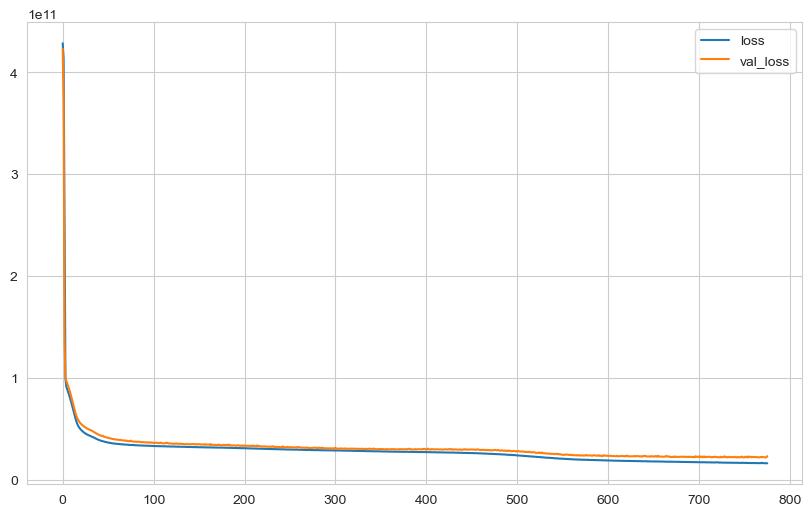

In [95]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [96]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [97]:
eval_metric(y_test, y_pred)


# burada aslında modelimizde bir overfitting durumu yoktu ama şu anda bu regularization tekiniğini görmek için bunu kullandık
# skorlarımızın düşmesinin nedeni bu.

r2_score: 0.8717449325416139 
mae: 77873.24276620371 
mse: 16478180534.285938 
rmse: 128367.36553457011


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [1]:
from tensorflow.keras.layers import Dropout

# ---> Dropout'ta bir regularization tekniğidir.
# Dropout, ağın belirli bir kısmını her İTERASYONDA rastgele seçerek "eğitim" sırasında devre dışı bırakır.Yukarıda şekilde 
# görüleceği gibi. biz modelimizin datayı ezberlemesini engellemek isteriz datadaki kuralları öğrenmesini datanın yapısını 
# anlamasını isteriz ama model datayı takıntı haline getirirse yani ezberlerse bu dropout yöntemi de kullanabileceğimiz bir 
# regularization tekniğidir.


# Dropout'u bir layer gibi modelimize ekleyeceğiz aşağıdaki örnekte olduğu gibi. 
# model.add(Dropout(0.2)) demek her iterasyonda nöronların MAX  %20 'si kapanacak demektir ve bu her iterasyonda RASTGELE olur

In [99]:
tf.keras.utils.set_random_seed(seed) 

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
 
model.add(Dense(24, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(12, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(6, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.002)
model.compile(optimizer = opt, loss = 'mse')

In [100]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 25, restore_best_weights = True)

In [101]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 2s 4ms/step - loss: 428448120832.0000 - val_loss: 422790725632.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 406179119104.0000 - val_loss: 343142858752.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 213077016576.0000 - val_loss: 105696174080.0000
Epoch 4/1000
130/130 [==============================] - 0s 4ms/step - loss: 124501901312.0000 - val_loss: 100575150080.0000
Epoch 5/1000
130/130 [==============================] - 0s 4ms/step - loss: 121233932288.0000 - val_loss: 97067565056.0000
Epoch 6/1000
130/130 [==============================] - 0s 4ms/step - loss: 120481832960.0000 - val_loss: 95404433408.0000
Epoch 7/1000
130/130 [==============================] - 1s 4ms/step - loss: 116940324864.0000 - val_loss: 91240972288.0000
Epoch 8/1000
130/130 [==============================] - 0s 4ms/step - loss: 118083321856.0000 - val_loss: 88865660928.0000
Epoch 9/1000

130/130 [==============================] - 0s 3ms/step - loss: 72081260544.0000 - val_loss: 38771425280.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 69799157760.0000 - val_loss: 37926297600.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 70278897664.0000 - val_loss: 38121836544.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 70691086336.0000 - val_loss: 38528864256.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 67451797504.0000 - val_loss: 38264758272.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 69078056960.0000 - val_loss: 36611801088.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 71854374912.0000 - val_loss: 38286233600.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 67206238208.0000 - val_loss: 39799050240.0000
Epoch 141/1000
130/130 

<Axes: >

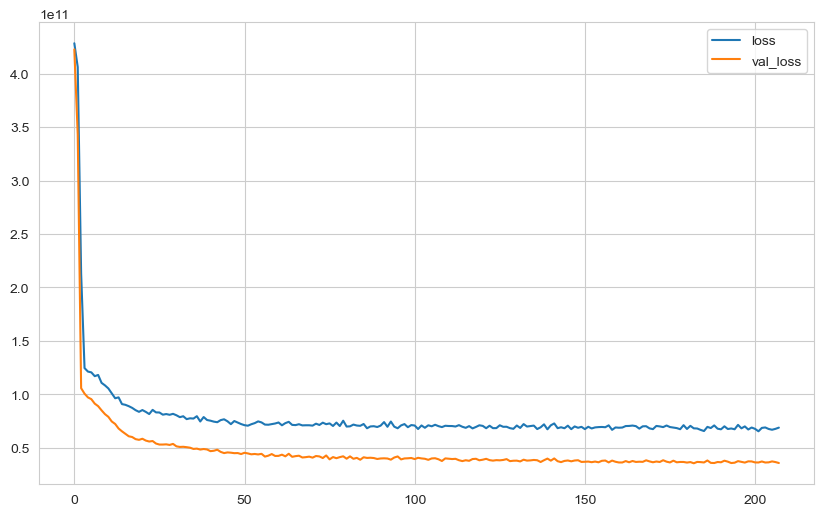

In [102]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
# burada dikkat edersek eğitim datasında hata daha fazla burada bir overfitting durumu yok.

In [103]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [104]:
eval_metric(y_test, y_pred)

# burada aslında modelimizde bir overfitting durumu yoktu ama şu anda bu regularization tekiniğini görmek için bunu kullandık
# skorlarımızın düşmesinin nedeni bu.

r2_score: 0.7681639114921099 
mae: 105394.18731372975 
mse: 29786245459.93264 
rmse: 172586.92146258545


## Saving Final Model and Scaler

In [105]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

# scaler'ımızı pickle ile dump ediyoruz.

In [106]:
tf.keras.utils.set_random_seed(seed) 

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.002)


model.compile(optimizer = opt, loss = 'mse')

In [107]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 100, restore_best_weights = True)

In [108]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1500,
         callbacks = [early_stop]
         )


# burada validation datası olarak test datasını kullandık bu artık final model . train datası olarak da daha fazla datayla
# modeli eğitiyoruz . early_stopdaki patience'ı = 100 olduğuna dikkat edelim ve burada epoch sayımı 1500 yapıyorum yani model
# daha fazla eğitilecek.

Epoch 1/1500
152/152 [==============================] - 1s 3ms/step - loss: 427535106048.0000 - val_loss: 414710202368.0000
Epoch 2/1500
152/152 [==============================] - 0s 2ms/step - loss: 386770665472.0000 - val_loss: 287275548672.0000
Epoch 3/1500
152/152 [==============================] - 0s 2ms/step - loss: 159262081024.0000 - val_loss: 88033869824.0000
Epoch 4/1500
152/152 [==============================] - 0s 2ms/step - loss: 92982870016.0000 - val_loss: 85151301632.0000
Epoch 5/1500
152/152 [==============================] - 0s 2ms/step - loss: 90047709184.0000 - val_loss: 82134384640.0000
Epoch 6/1500
152/152 [==============================] - 0s 2ms/step - loss: 86998319104.0000 - val_loss: 79114461184.0000
Epoch 7/1500
152/152 [==============================] - 0s 3ms/step - loss: 83762626560.0000 - val_loss: 75815395328.0000
Epoch 8/1500
152/152 [==============================] - 0s 3ms/step - loss: 80268435456.0000 - val_loss: 72444207104.0000
Epoch 9/1500
152/15

152/152 [==============================] - 0s 3ms/step - loss: 31142045696.0000 - val_loss: 26453442560.0000
Epoch 134/1500
152/152 [==============================] - 0s 2ms/step - loss: 31026956288.0000 - val_loss: 26405963776.0000
Epoch 135/1500
152/152 [==============================] - 0s 2ms/step - loss: 31102834688.0000 - val_loss: 26399772672.0000
Epoch 136/1500
152/152 [==============================] - 0s 3ms/step - loss: 30879670272.0000 - val_loss: 26398754816.0000
Epoch 137/1500
152/152 [==============================] - 1s 4ms/step - loss: 30926252032.0000 - val_loss: 26209218560.0000
Epoch 138/1500
152/152 [==============================] - 1s 4ms/step - loss: 30810634240.0000 - val_loss: 26190903296.0000
Epoch 139/1500
152/152 [==============================] - 0s 3ms/step - loss: 30695499776.0000 - val_loss: 26071007232.0000
Epoch 140/1500
152/152 [==============================] - 1s 3ms/step - loss: 30683262976.0000 - val_loss: 26029129728.0000
Epoch 141/1500
152/152 

152/152 [==============================] - 0s 3ms/step - loss: 21348847616.0000 - val_loss: 18766649344.0000
Epoch 266/1500
152/152 [==============================] - 0s 2ms/step - loss: 21316495360.0000 - val_loss: 18932879360.0000
Epoch 267/1500
152/152 [==============================] - 0s 3ms/step - loss: 21314039808.0000 - val_loss: 18881609728.0000
Epoch 268/1500
152/152 [==============================] - 0s 3ms/step - loss: 21295087616.0000 - val_loss: 18802139136.0000
Epoch 269/1500
152/152 [==============================] - 0s 2ms/step - loss: 21375168512.0000 - val_loss: 18684461056.0000
Epoch 270/1500
152/152 [==============================] - 0s 2ms/step - loss: 21208258560.0000 - val_loss: 18713128960.0000
Epoch 271/1500
152/152 [==============================] - 0s 2ms/step - loss: 21239283712.0000 - val_loss: 18919432192.0000
Epoch 272/1500
152/152 [==============================] - 0s 2ms/step - loss: 21130766336.0000 - val_loss: 19289274368.0000
Epoch 273/1500
152/152 

152/152 [==============================] - 1s 6ms/step - loss: 19443245056.0000 - val_loss: 17886724096.0000
Epoch 398/1500
152/152 [==============================] - 0s 3ms/step - loss: 19361886208.0000 - val_loss: 17744304128.0000
Epoch 399/1500
152/152 [==============================] - 1s 3ms/step - loss: 19414671360.0000 - val_loss: 17790171136.0000
Epoch 400/1500
152/152 [==============================] - 1s 6ms/step - loss: 19367770112.0000 - val_loss: 17775190016.0000
Epoch 401/1500
152/152 [==============================] - 0s 3ms/step - loss: 19316144128.0000 - val_loss: 17768839168.0000
Epoch 402/1500
152/152 [==============================] - 0s 3ms/step - loss: 19349432320.0000 - val_loss: 18030000128.0000
Epoch 403/1500
152/152 [==============================] - 0s 3ms/step - loss: 19312676864.0000 - val_loss: 17800568832.0000
Epoch 404/1500
152/152 [==============================] - 0s 3ms/step - loss: 19357827072.0000 - val_loss: 17763217408.0000
Epoch 405/1500
152/152 

152/152 [==============================] - 0s 3ms/step - loss: 18209409024.0000 - val_loss: 16940044288.0000
Epoch 530/1500
152/152 [==============================] - 0s 3ms/step - loss: 18250729472.0000 - val_loss: 16883397632.0000
Epoch 531/1500
152/152 [==============================] - 1s 8ms/step - loss: 18199791616.0000 - val_loss: 16776680448.0000
Epoch 532/1500
152/152 [==============================] - 1s 5ms/step - loss: 18135083008.0000 - val_loss: 16671504384.0000
Epoch 533/1500
152/152 [==============================] - 1s 5ms/step - loss: 18158635008.0000 - val_loss: 16785171456.0000
Epoch 534/1500
152/152 [==============================] - 0s 3ms/step - loss: 18158845952.0000 - val_loss: 16770862080.0000
Epoch 535/1500
152/152 [==============================] - 0s 3ms/step - loss: 18179352576.0000 - val_loss: 16677325824.0000
Epoch 536/1500
152/152 [==============================] - 1s 4ms/step - loss: 18161463296.0000 - val_loss: 16807121920.0000
Epoch 537/1500
152/152 

152/152 [==============================] - 1s 4ms/step - loss: 17071050752.0000 - val_loss: 15709169664.0000
Epoch 662/1500
152/152 [==============================] - 0s 3ms/step - loss: 16981202944.0000 - val_loss: 15621613568.0000
Epoch 663/1500
152/152 [==============================] - 0s 3ms/step - loss: 17018723328.0000 - val_loss: 15670377472.0000
Epoch 664/1500
152/152 [==============================] - 1s 4ms/step - loss: 16972648448.0000 - val_loss: 15673865216.0000
Epoch 665/1500
152/152 [==============================] - 0s 3ms/step - loss: 16973202432.0000 - val_loss: 15688398848.0000
Epoch 666/1500
152/152 [==============================] - 0s 3ms/step - loss: 16959333376.0000 - val_loss: 15615343616.0000
Epoch 667/1500
152/152 [==============================] - 0s 2ms/step - loss: 16960974848.0000 - val_loss: 15589573632.0000
Epoch 668/1500
152/152 [==============================] - 0s 2ms/step - loss: 16967890944.0000 - val_loss: 15711994880.0000
Epoch 669/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 15970895872.0000 - val_loss: 14761476096.0000
Epoch 794/1500
152/152 [==============================] - 0s 2ms/step - loss: 15959247872.0000 - val_loss: 14610038784.0000
Epoch 795/1500
152/152 [==============================] - 0s 2ms/step - loss: 16014795776.0000 - val_loss: 14623171584.0000
Epoch 796/1500
152/152 [==============================] - 0s 2ms/step - loss: 15965710336.0000 - val_loss: 14660441088.0000
Epoch 797/1500
152/152 [==============================] - 0s 2ms/step - loss: 15987589120.0000 - val_loss: 14656034816.0000
Epoch 798/1500
152/152 [==============================] - 0s 2ms/step - loss: 16018823168.0000 - val_loss: 14798106624.0000
Epoch 799/1500
152/152 [==============================] - 0s 2ms/step - loss: 16032326656.0000 - val_loss: 14638670848.0000
Epoch 800/1500
152/152 [==============================] - 0s 2ms/step - loss: 15950495744.0000 - val_loss: 14609358848.0000
Epoch 801/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 14528573440.0000 - val_loss: 13433871360.0000
Epoch 926/1500
152/152 [==============================] - 0s 2ms/step - loss: 14567292928.0000 - val_loss: 13252417536.0000
Epoch 927/1500
152/152 [==============================] - 0s 2ms/step - loss: 14531424256.0000 - val_loss: 13262433280.0000
Epoch 928/1500
152/152 [==============================] - 0s 2ms/step - loss: 14456590336.0000 - val_loss: 13544433664.0000
Epoch 929/1500
152/152 [==============================] - 0s 3ms/step - loss: 14483280896.0000 - val_loss: 13190643712.0000
Epoch 930/1500
152/152 [==============================] - 0s 3ms/step - loss: 14420615168.0000 - val_loss: 13232447488.0000
Epoch 931/1500
152/152 [==============================] - 0s 2ms/step - loss: 14388199424.0000 - val_loss: 13497850880.0000
Epoch 932/1500
152/152 [==============================] - 0s 3ms/step - loss: 14411300864.0000 - val_loss: 13331731456.0000
Epoch 933/1500
152/152 

Epoch 1057/1500
152/152 [==============================] - 0s 2ms/step - loss: 13285814272.0000 - val_loss: 12522082304.0000
Epoch 1058/1500
152/152 [==============================] - 0s 2ms/step - loss: 13168385024.0000 - val_loss: 12433921024.0000
Epoch 1059/1500
152/152 [==============================] - 0s 2ms/step - loss: 13195706368.0000 - val_loss: 12522714112.0000
Epoch 1060/1500
152/152 [==============================] - 0s 2ms/step - loss: 13300728832.0000 - val_loss: 12396898304.0000
Epoch 1061/1500
152/152 [==============================] - 0s 2ms/step - loss: 13190033408.0000 - val_loss: 12619466752.0000
Epoch 1062/1500
152/152 [==============================] - 0s 2ms/step - loss: 13176445952.0000 - val_loss: 12483637248.0000
Epoch 1063/1500
152/152 [==============================] - 0s 2ms/step - loss: 13193186304.0000 - val_loss: 12578562048.0000
Epoch 1064/1500
152/152 [==============================] - 0s 2ms/step - loss: 13199097856.0000 - val_loss: 12721629184.0000


152/152 [==============================] - 0s 2ms/step - loss: 12522105856.0000 - val_loss: 12197370880.0000
Epoch 1188/1500
152/152 [==============================] - 0s 2ms/step - loss: 12522577920.0000 - val_loss: 12522207232.0000
Epoch 1189/1500
152/152 [==============================] - 0s 2ms/step - loss: 12477225984.0000 - val_loss: 12554615808.0000
Epoch 1190/1500
152/152 [==============================] - 0s 2ms/step - loss: 12489841664.0000 - val_loss: 12430177280.0000
Epoch 1191/1500
152/152 [==============================] - 0s 2ms/step - loss: 12505207808.0000 - val_loss: 12364365824.0000
Epoch 1192/1500
152/152 [==============================] - 0s 2ms/step - loss: 12528234496.0000 - val_loss: 12459302912.0000
Epoch 1193/1500
152/152 [==============================] - 0s 2ms/step - loss: 12471238656.0000 - val_loss: 12147942400.0000
Epoch 1194/1500
152/152 [==============================] - 0s 2ms/step - loss: 12437703680.0000 - val_loss: 12268281856.0000
Epoch 1195/1500


152/152 [==============================] - 0s 2ms/step - loss: 12100687872.0000 - val_loss: 12435050496.0000
Epoch 1318/1500
152/152 [==============================] - 0s 3ms/step - loss: 12129122304.0000 - val_loss: 12744711168.0000
Epoch 1319/1500
152/152 [==============================] - 0s 2ms/step - loss: 12146135040.0000 - val_loss: 12454515712.0000
Epoch 1320/1500
152/152 [==============================] - 0s 2ms/step - loss: 12097461248.0000 - val_loss: 12478033920.0000
Epoch 1321/1500
152/152 [==============================] - 0s 2ms/step - loss: 12161346560.0000 - val_loss: 12546757632.0000
Epoch 1322/1500
152/152 [==============================] - 0s 2ms/step - loss: 12090168320.0000 - val_loss: 12426381312.0000
Epoch 1323/1500
152/152 [==============================] - 0s 3ms/step - loss: 12136596480.0000 - val_loss: 12741791744.0000
Epoch 1324/1500
152/152 [==============================] - 0s 2ms/step - loss: 12073904128.0000 - val_loss: 12287132672.0000
Epoch 1325/1500


152/152 [==============================] - 0s 2ms/step - loss: 11887754240.0000 - val_loss: 12305682432.0000
Epoch 1448/1500
152/152 [==============================] - 0s 2ms/step - loss: 11751801856.0000 - val_loss: 12239588352.0000
Epoch 1449/1500
152/152 [==============================] - 0s 2ms/step - loss: 11826499584.0000 - val_loss: 12377368576.0000
Epoch 1450/1500
152/152 [==============================] - 0s 2ms/step - loss: 11800800256.0000 - val_loss: 12348592128.0000
Epoch 1451/1500
152/152 [==============================] - 0s 2ms/step - loss: 11866146816.0000 - val_loss: 12280194048.0000
Epoch 1452/1500
152/152 [==============================] - 0s 2ms/step - loss: 11762840576.0000 - val_loss: 12104816640.0000
Epoch 1453/1500
152/152 [==============================] - 0s 2ms/step - loss: 11681947648.0000 - val_loss: 12597167104.0000
Epoch 1454/1500
152/152 [==============================] - 0s 2ms/step - loss: 11780478976.0000 - val_loss: 12390921216.0000
Epoch 1455/1500


<Axes: >

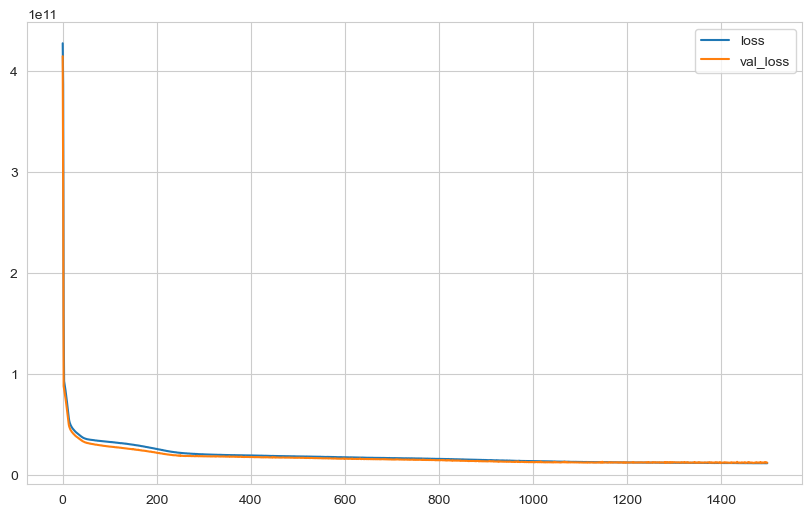

In [109]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [110]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 3ms/step


In [111]:
eval_metric(y_test, y_pred)


## skorlarımız arttı bunun nedeni daha fazla datayla eğitim yapması olabilceği gibi biz ne yaptık bu sefer 1500 epoch ile modeli
# eğittik early_stop da 100 patience olduğundan devreye girmedi hemen yukarıdaki grafiğimize bakarsak overifitting de yok bizim
# için şu anda iyi bir durum.

r2_score: 0.9050768160740899 
mae: 67447.51166811342 
mse: 12195708073.116774 
rmse: 110434.17982271963


In [112]:
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'


# deep learning'te modeli kaydederken pickle ile kaydedemiyoruz kendine has bir kaydetme methodu var o da model.save şeklinde
# istersek h5 uzantılı olarak kaydederiz istersek uzantısız kaydederiz modeli kaydettiğimizde modelin ağırlıkları , mimamirisi,
# compile satırı da kaydedilmiş olur bu da aslında transfer learninge imkan tanıyan bir husus.

## Loading Model and Scaler

In [113]:
from tensorflow.keras.models import load_model

# model.save ile kaydettiğimi bir model load_model ile tekrar kullanmak üzere çağırabiliriz.

In [114]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [115]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [116]:
single_house = scaler_kc_house.transform(single_house)
single_house

## modeli nasıl eğittiysek tahmin alırken de o şekle getirmeliyiz.scaler yapıyoruz bundan dolayı

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.57149751, 0.21760797, 0.15304348, 0.00573322,
        0.47826087]])

In [117]:
model_kc_house.predict(single_house)

1/1 [==============================] - 0s 232ms/step


array([[243017.62]], dtype=float32)

In [118]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [119]:
from sklearn.linear_model import LinearRegression 

In [120]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7054431219005433 
mae: 124715.1481019047 
mse: 37844597575.166885 
rmse: 194536.87973021177


### Random Forest

In [121]:
from sklearn.ensemble import RandomForestRegressor

In [122]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8912532816836695 
mae: 64653.2709236993 
mse: 13971752480.727938 
rmse: 118202.16783429963


In [ ]:
# traditional ml algoritmaları data miktarımız 20K civarında olduğu için dl algoritmalarına göre performansı iyi çıkabilir.
# mesela rf'da herhangi bir optimizasyon yapmamamıza rağmen skorlar gayet iyi .

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___